In [1]:
# DATA ACCESS
import requests # library to handle requests
from bs4 import BeautifulSoup # library to parse HTML documents 
import lxml
# import openpyxl

# MODEL
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, SplineTransformer
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
import pymc as pm
import arviz as az

# PLOTS
import os
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import ticker
plt.rcParams['figure.dpi'] = 300
import matplotlib.dates as mdates
import matplotlib.ticker as ticker

# FORMATTING
import math
import numpy as np
import pandas as pd
import datetime as dt
from datetime import datetime, date
from math import ceil

import warnings
warnings.filterwarnings('ignore')

### REFERENCES 
##### Statistical Rethinking - McElreath
##### BDA2 - Gelman
##### https://www.pymc.io/projects/examples/en/latest/time_series/Forecasting_with_structural_timeseries.html

In [2]:
RANDOM_SEED = 8929
rng = np.random.default_rng(RANDOM_SEED)

## IMPORT API KEYS
- EIA: https://www.eia.gov/opendata/index.php

In [3]:
# EIA API Key
f = open("api/eia.txt", "r")
eia_key = f.read()

In [4]:
# convert month-name to number
month_labels = {'Jan':1, 'Feb':2,'Mar':3,'Apr':4,'May':5,'Jun':6,
                'Jul':7,'Aug':8,'Sep':9,'Oct':10,'Nov':11,'Dec':12}

In [5]:
# df_vmt = pd.read_csv('vmt.csv') # https://fred.stlouisfed.org/series/TRFVOLUSM227NFWA
df_vmt = pd.read_csv('data/M12MTVUSM227NFWA.csv')
df_vmt.columns = ["date", "million_miles"]
df_vmt.date = pd.to_datetime(df_vmt.date)
df_vmt['year'] = df_vmt['date'].dt.year

In [6]:
eia_gas = 'https://www.eia.gov/dnav/pet/hist/LeafHandler.ashx?n=pet&s=emm_epm0_pte_nus_dpg&f=m'
response=requests.get(eia_gas)
print(response.status_code)

# parse data from the html into a beautifulsoup object
soup = BeautifulSoup(response.text, 'html.parser')
#indiatable=soup.find_all('table',{'class':"wikitable"})
indiatable = soup.find_all('table')#,class_="table")
df=pd.read_html(str(indiatable))
df_gas=pd.DataFrame(df[10])
df_gas = df_gas[df_gas['Year'].notnull()].reset_index(drop=True)

df_gas = pd.melt(df_gas, id_vars=['Year'], value_vars=['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'])
df_gas = df_gas[df_gas['value'].notnull()].reset_index(drop=True)
df_gas['gas_price'] = df_gas.value
df_gas.columns = ['year','month_name','value','gas_price']
df_gas['month'] = df_gas['month_name'].apply(lambda x: month_labels[x])
df_gas = df_gas[['year','month','gas_price']]
df_gas.year = df_gas.year.astype('int')
df_gas['day'] = 1
df_gas['date'] = pd.to_datetime(df_gas[['year', 'month', 'day']])
df_gas = df_gas[['date','year','gas_price']]
df_gas = df_gas.sort_values('date').reset_index(drop=True)

200


In [7]:
eia_base = 'http://api.eia.gov/v2/electricity/retail-sales/data/?'
body = '&frequency=monthly&data[0]=price&facets[sectorid][]=RES&facets[stateid][]=US&sort[0][column]=period&sort[0][direction]=desc&offset=0&length=5000'
response = requests.get(f'{eia_base}api_key={eia_key}{body}')

df_kwh = pd.DataFrame.from_dict(response.json()['response']['data'])
df_kwh['date'] = pd.to_datetime(df_kwh.period)
df_kwh['year'] = df_kwh['date'].dt.year
df_kwh['gal_price'] = df_kwh.price.astype('float')/100 * 7.5
df_kwh['kwh_price'] = df_kwh['price'].astype('float')/100
df_kwh = df_kwh[['date','year','kwh_price','gal_price']]

### BIND IT

In [8]:
b1 = pd.merge(df_kwh,df_gas,how='left',on=['date','year'])
final = pd.merge(b1,df_vmt,how='left',on=['date','year'])

# MAKE MORE COLUMNS
final['gal_month'] = (final['million_miles']/12/25)*10**6
final['elec'] = (final['gal_price'] * final.gal_month)/10**9 # billion USD
final['gas'] = (final.gas_price * final.gal_month)/10**9 # billion USD
final['excess_cost'] = final.gas - final.elec

## PLOTS

In [9]:
df_gas_year = df_gas.groupby(['year'],as_index=False).agg(gas_price = ('gas_price','mean'))
df_kwh_year = df_kwh.groupby(['year'],as_index=False).agg(gal_price = ('gal_price','mean'))

g_x = np.array(df_gas_year.year)
g_y = df_gas_year.gas_price
G_train = g_x[:, np.newaxis]

g_model = make_pipeline(SplineTransformer(n_knots=8, degree=5), Ridge(alpha=1e-3))
g_model.fit(G_train,g_y)

k_x = np.array(df_kwh_year.year)
k_y = df_kwh_year.gal_price
K_train = k_x[:, np.newaxis]

k_model = make_pipeline(SplineTransformer(n_knots=3, degree=1), Ridge(alpha=1e-3))
k_model.fit(K_train,k_y);

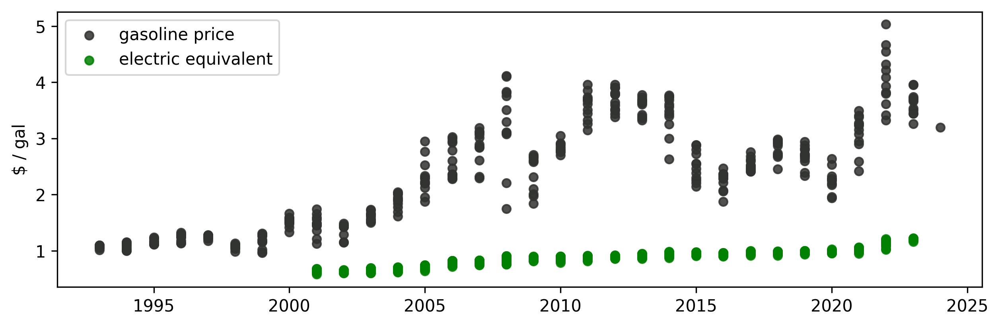

In [10]:
g_plot = g_model.predict(G_train)
k_plot = k_model.predict(K_train)

plt.figure(figsize=(10,3))
plt.scatter(df_gas.year,df_gas.gas_price,label='gasoline price',c='#313330',alpha=.85,s=25)
plt.scatter(df_kwh.year,df_kwh.gal_price,label='electric equivalent',c='green',alpha=.85,s=25)
plt.legend()
plt.ylabel('$ / gal')
# plt.plot(G_train, g_plot, label="B-spline", c='#313330',alpha=.5)
# plt.plot(K_train, k_plot, label="B-spline", c='green',alpha=.5)

plt.savefig('../../../../gas_v_electric.jpg',dpi=200);

Text(0, 0.5, '$ / gal')

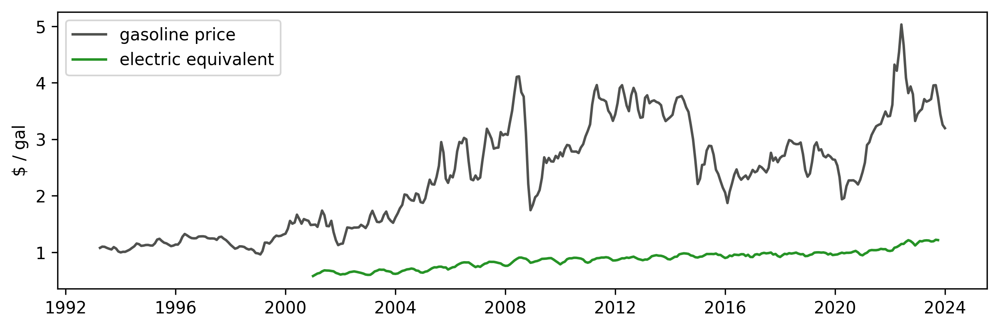

In [11]:
plt.figure(figsize=(10,3))
plt.plot(df_gas.date,df_gas.gas_price,label='gasoline price',c='#313330',alpha=.85)
plt.plot(df_kwh.date,df_kwh.gal_price,label='electric equivalent',c='green',alpha=.85)
plt.legend()
plt.ylabel('$ / gal')

## BAYESIAN

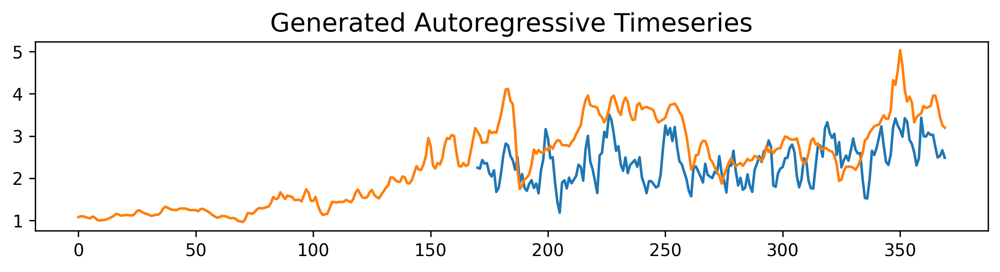

In [12]:
def simulate_ar(intercept, coef1, coef2, noise=0.3, *, warmup=10, steps=200):
    # We sample some extra warmup steps, to let the AR process stabilize
    draws = np.zeros(warmup + steps)
    # Initialize first draws at intercept
    draws[:2] = intercept
    for step in range(2, warmup + steps):
        draws[step] = (
            intercept
            + coef1 * draws[step - 1]
            + coef2 * draws[step - 2]
            + np.random.normal(0, noise)
        )
    # Discard the warmup draws
    return draws[warmup:]


# True parameters of the AR process
ar1_data = simulate_ar(.5, 0.9, -.1)
real_data = np.array(df_gas.gas_price)

fig, ax = plt.subplots(figsize=(10, 2))
x = np.arange(0,len(real_data))
ax.set_title("Generated Autoregressive Timeseries", fontsize=15)
sns.lineplot(ax=ax,x=np.arange(0,len(real_data))[-200:],y=ar1_data)
ax.plot(real_data);

## Specify the Model:

In [13]:
## Set up a dictionary for the specification of our priors
## We set up the dictionary to specify size of the AR coefficients in
## case we want to vary the AR lags.
priors = {
    "coefs": {"mu": [2, 0.2], "sigma": [0.1, 0.1], "size": 2},
    "sigma": 3,
    "init": {"mu": 2, "sigma": 0.1, "size": 1},
}

## Initialise the model
with pm.Model() as AR:
    pass

## Define the time interval for fitting the data
t_data = list(range(len(ar1_data)))
## Add the time interval as a mutable coordinate to the model to allow for future predictions
AR.add_coord("obs_id", t_data, mutable=True)

with AR:
    ## Data containers to enable prediction
    t = pm.MutableData("t", t_data, dims="obs_id")
    y = pm.MutableData("y", ar1_data, dims="obs_id")

    # The first coefficient will be the constant term but we need to set priors for each coefficient in the AR process
    coefs = pm.Normal("coefs", priors["coefs"]["mu"], priors["coefs"]["sigma"])
    sigma = pm.HalfNormal("sigma", priors["sigma"])
    # We need one init variable for each lag, hence size is variable too
    init = pm.Normal.dist(
        priors["init"]["mu"], priors["init"]["sigma"], size=priors["init"]["size"]
    )
    # Steps of the AR model minus the lags required
    ar1 = pm.AR(
        "ar",
        coefs,
        sigma=sigma,
        init_dist=init,
        constant=True,
        steps=t.shape[0] - (priors["coefs"]["size"] - 1),
        dims="obs_id",
    )

    # The Likelihood
    outcome = pm.Normal("likelihood", mu=ar1, sigma=sigma, observed=y, dims="obs_id")
    ## Sampling
    idata_ar = pm.sample_prior_predictive()
    idata_ar.extend(pm.sample(500, random_seed=100, target_accept=0.95))
    idata_ar.extend(pm.sample_posterior_predictive(idata_ar))

Sampling: [ar, coefs, likelihood, sigma]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [coefs, sigma, ar]


Sampling 2 chains for 1_000 tune and 500 draw iterations (2_000 + 1_000 draws total) took 40 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Sampling: [likelihood]


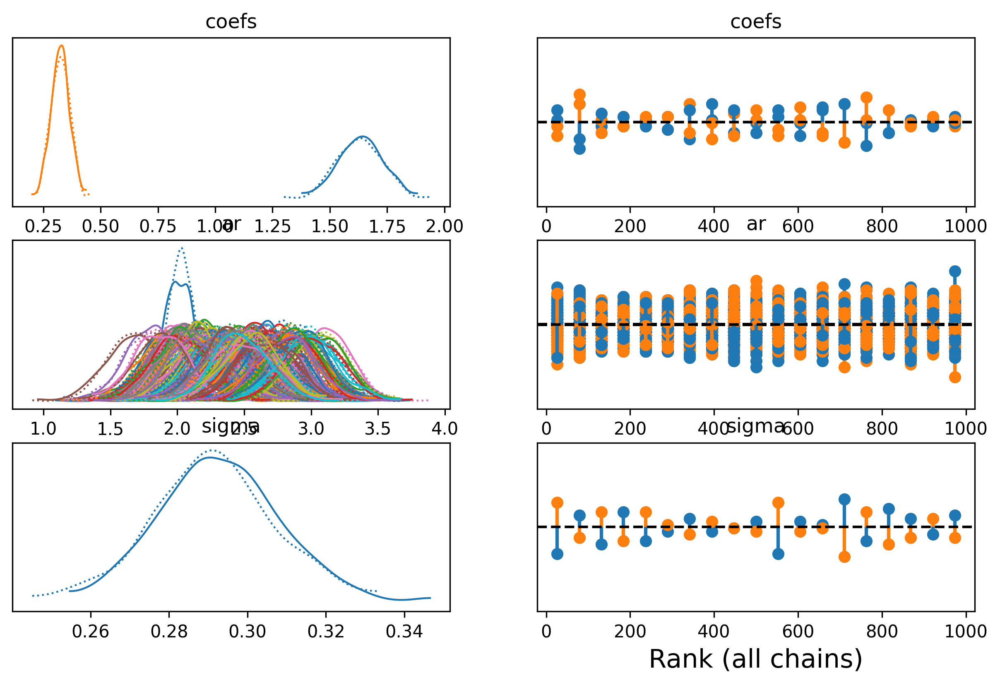

In [14]:
az.plot_trace(idata_ar, figsize=(10, 6), kind="rank_vlines");

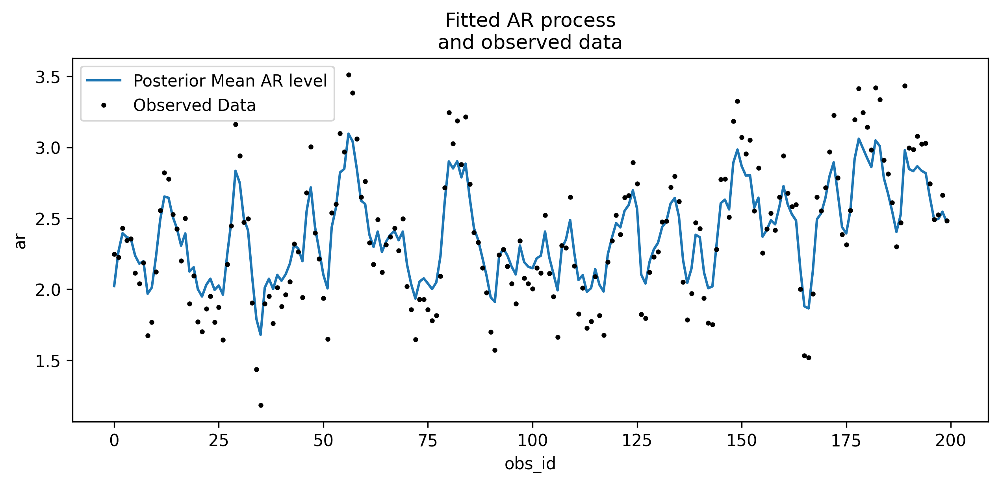

In [15]:
fig, ax = plt.subplots(figsize=(10, 4))
idata_ar.posterior.ar.mean(["chain", "draw"]).plot(ax=ax, label="Posterior Mean AR level")
ax.plot(ar1_data, "o", color="black", markersize=2, label="Observed Data")
ax.legend()
ax.set_title("Fitted AR process\nand observed data");

In [16]:
az.summary(idata_ar, var_names=["~ar"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
coefs[0],1.633,0.097,1.453,1.809,0.005,0.004,350.0,684.0,1.0
coefs[1],0.324,0.041,0.248,0.397,0.002,0.002,345.0,602.0,1.0
sigma,0.292,0.016,0.261,0.321,0.001,0.001,377.0,567.0,1.0


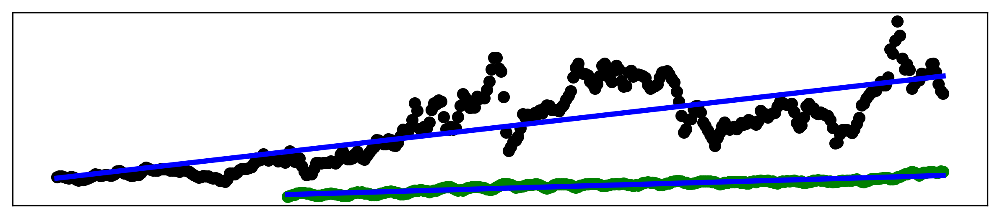

In [17]:
df_kwh = df_kwh.sort_values('date') # orient correctly

# REGR GAS
y = np.array(df_gas.gas_price)
length = y.shape[0]

x = np.arange(length, dtype=float).reshape((length, 1))
y = y.reshape(length, 1)

regr = LinearRegression()
regr.fit(x, y)

# REGR ELECTRIC
y_e = np.array(df_kwh.gal_price)
length_e = y_e.shape[0]

x_e = np.arange(length_e, dtype=float).reshape((length_e, 1))
y_e = y_e.reshape(length_e, 1)

regr_e = LinearRegression()
regr_e.fit(x_e, y_e)

# plot it as in the example at http://scikit-learn.org/
plt.figure(figsize=(10,2))
plt.scatter(x, y,  color='black',label='gas')
plt.scatter(x[96:], y_e,  color='green', label='electric')
plt.plot(x, regr.predict(x), color='blue', linewidth=3)
plt.plot(x[96:], regr_e.predict(x_e), color='blue', linewidth=3)

plt.xticks(())
plt.yticks(())
plt.show()

In [18]:
print('gas coef',regr.intercept_, regr.coef_, regr.score(x, y))
print('kwh coef',regr_e.intercept_, regr_e.coef_, regr_e.score(x_e, y_e))

gas coef [1.05048305] [[0.00702354]] 0.6265898345030436
kwh coef [0.63454945] [[0.00177162]] 0.898155708874737


## PREDICTION

In [19]:
def todate(x, pos, lowest = min(df_gas.date)):
    d = pd.to_datetime(lowest)+pd.DateOffset(months=x)
    return d.strftime("%Y-%m-%d")

def toyear(x, pos, lowest = min(df_gas.date)):
    d = pd.to_datetime(lowest)+pd.DateOffset(months=x)
    return d.strftime("%Y")

def months_diff(start, end):
    return ceil((end - start).days / 30)

In [20]:
def plot_fits(idata_ar, idata_preds,color_line='cyan',save_fig='AR_plot'):
    palette = "plasma"
    cmap = plt.get_cmap(palette)
    percs = np.linspace(51, 99, 100)
    colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))
    mosaic = """AABB
                CCCC"""
    fig, axs = plt.subplot_mosaic(mosaic, sharex=False, figsize=(20*.8, 10*.8))
    axs = [axs[k] for k in axs.keys()]
    for i, p in enumerate(percs[::-1]):
        upper = np.percentile(
            az.extract_dataset(idata_ar, group="prior_predictive", num_samples=1000)["likelihood"],
            p,
            axis=1,
        )
        lower = np.percentile(
            az.extract_dataset(idata_ar, group="prior_predictive", num_samples=1000)["likelihood"],
            100 - p,
            axis=1,
        )
        color_val = colors[i]
        axs[0].fill_between(
            x=idata_ar["constant_data"]["t"],
            y1=upper.flatten(),
            y2=lower.flatten(),
            color=cmap(color_val),
            alpha=0.1,
        )

    axs[0].plot(
        az.extract_dataset(idata_ar, group="prior_predictive", num_samples=1000)["likelihood"].mean(
            axis=1
        ),
        color=color_line,
        label="Prior Predicted Mean Realisation",
    )

    axs[0].scatter(
        x=idata_ar["constant_data"]["t"],
        y=idata_ar["constant_data"]["y"],
        color="k",
        label="Observed Data points",
    )
    axs[0].set_title("Prior Predictive Fit", fontsize=20)
    axs[0].legend()

    for i, p in enumerate(percs[::-1]):
        upper = np.percentile(
            az.extract_dataset(idata_preds, group="predictions", num_samples=1000)["likelihood"],
            p,
            axis=1,
        )
        lower = np.percentile(
            az.extract_dataset(idata_preds, group="predictions", num_samples=1000)["likelihood"],
            100 - p,
            axis=1,
        )
        color_val = colors[i]
        axs[2].fill_between(
            x=idata_preds["predictions_constant_data"]["t"],
            y1=upper.flatten(),
            y2=lower.flatten(),
            color=cmap(color_val),
            alpha=0.1,
        )

        upper = np.percentile(
            az.extract_dataset(idata_preds, group="predictions", num_samples=1000)["yhat_fut"],
            p,
            axis=1,
        )
        lower = np.percentile(
            az.extract_dataset(idata_preds, group="predictions", num_samples=1000)["yhat_fut"],
            100 - p,
            axis=1,
        )
        color_val = colors[i]
        axs[2].fill_between(
            x=idata_preds["predictions"].coords["obs_id_fut"].data,
            y1=upper.flatten(),
            y2=lower.flatten(),
            color=cmap(color_val),
            alpha=0.1,
        )
    # likelihood
    axs[2].plot(
        az.extract_dataset(idata_preds, group="predictions", num_samples=1000)["likelihood"].mean(
            axis=1
        ),
        color=color_line,
    )
    idata_preds.predictions.yhat_fut.mean(["chain", "draw"]).plot(
        ax=axs[2], color=color_line, label="Predicted Mean Realisation"
    )
    axs[2].scatter(
        x=idata_ar["constant_data"]["t"],
        y=idata_ar["constant_data"]["y"],
        color="k",
        label="Observed Data",
    )
    
    axs[2].set_xlabel("Time in Months")
    axs[2].set_ylabel("$ per gallon")
    axs[0].set_xlabel("Time in Months")
    axs[0].set_ylabel("$ per gallon")
    az.plot_ppc(idata_ar, ax=axs[1])
    
    axs[2].set_title("Posterior Predictions Plotted", fontsize=20)
    axs[2].axvline(np.max(idata_ar["constant_data"]["t"]), color="black",linestyle='--',
                   label='Prediction Begins')
    fmt = ticker.FuncFormatter(todate)
    fmt_yr = ticker.FuncFormatter(toyear)
    axs[2].xaxis.set_major_formatter(todate)
    axs[2].xaxis.set_major_locator(mdates.DayLocator(interval=12*3))
    axs[0].xaxis.set_major_locator(mdates.DayLocator(interval=12*5))
#     axs[2].set_xlim([datetime.date(1994, 4, 1), datetime.date(2030, 1, 1)])
    axs[0].xaxis.set_major_formatter(fmt)
    axs[2].legend(loc='lower right')

    fig.patch.set_visible(False) 
    
    fig.savefig(f'plots/{save_fig}.png', transparent=True)
    return fig
# plot_fits(idata_ar, idata_preds)

### MORE SQUIGGLY

In [21]:
def make_latent_AR_trend_seasonal_model(
    ar_data, ff, priors, prediction_steps, full_sample=True, samples=1000,
):
    with pm.Model() as AR:
        pass

    ff = ff.to_numpy().T
    t_data = list(range(len(ar_data)))
    AR.add_coord("obs_id", t_data, mutable=True)
    ## The fourier features must be mutable to allow for addition fourier features to be
    ## passed in the prediction step.
    AR.add_coord("fourier_features", np.arange(len(ff)), mutable=True)

    with AR:
        ## Data containers to enable prediction
        t = pm.MutableData("t", t_data, dims="obs_id")
        y = pm.MutableData("y", ar_data, dims="obs_id")
        # The first coefficient will be the intercept term
        coefs = pm.Normal("coefs", priors["coefs"]["mu"], priors["coefs"]["sigma"])
        sigma = pm.HalfNormal("sigma", priors["sigma"])
        # We need one init variable for each lag, hence size is variable too
        init = pm.Normal.dist(
            priors["init"]["mu"], priors["init"]["sigma"], size=priors["init"]["size"]
        )
        # Steps of the AR model minus the lags required given specification
        ar1 = pm.AR(
            "ar",
            coefs,
            sigma=sigma,
            init_dist=init,
            constant=True,
            steps=t.shape[0] - (priors["coefs"]["size"] - 1),
            dims="obs_id",
        )

        ## Priors for the linear trend component
        alpha = pm.Normal("alpha", priors["alpha"]["mu"], priors["alpha"]["sigma"])
        beta = pm.Normal("beta", priors["beta"]["mu"], priors["beta"]["sigma"])
        trend = pm.Deterministic("trend", alpha + beta * t, dims="obs_id")

        ## Priors for seasonality
        beta_fourier = pm.Normal(
            "beta_fourier",
            mu=priors["beta_fourier"]["mu"],
            sigma=priors["beta_fourier"]["sigma"],
            dims="fourier_features",
        )
        fourier_terms = pm.MutableData("fourier_terms", ff)
        seasonality = pm.Deterministic(
            "seasonality", pm.math.dot(beta_fourier, fourier_terms), dims="obs_id"
        )

        mu = ar1 + trend + seasonality

        # The Likelihood
        outcome = pm.Normal("likelihood", mu=mu, sigma=sigma, observed=y, dims="obs_id")
        ## Sampling
        idata_ar = pm.sample_prior_predictive()
        if full_sample:
            idata_ar.extend(pm.sample(samples, random_seed=100, target_accept=0.95))
            idata_ar.extend(pm.sample_posterior_predictive(idata_ar))
        else:
            return idata_ar

    n = prediction_steps - ar_data.shape[0]
    n_order = 5
    periods = (ar_data.shape[0] + np.arange(n)) / 180

    fourier_features_new = pd.DataFrame(
        {
            f"{func}_order_{order}": getattr(np, func)(2 * np.pi * periods * order)
            for order in range(1, n_order + 1)
            for func in ("sin", "cos")
        }
    )

    with AR:
        AR.add_coords({"obs_id_fut_1": range(ar_data.shape[0] - 1, prediction_steps, 1)})
        AR.add_coords({"obs_id_fut": range(ar_data.shape[0], prediction_steps, 1)})
        t_fut = pm.MutableData(
#             "t_fut", list(range(ar1_data.shape[0], prediction_steps, 1)), dims="obs_id_fut"
            "t_fut", list(range(ar_data.shape[0], prediction_steps, 1)), dims="obs_id_fut"
        )
        ff_fut = pm.MutableData("ff_fut", fourier_features_new.to_numpy().T)
        # condition on the learned values of the AR process
        # initialise the future AR process precisely at the last observed value in the AR process
        # using the special feature of the dirac delta distribution to be 0 probability everywhere else.
        ar1_fut = pm.AR(
            "ar1_fut",
            init_dist=pm.DiracDelta.dist(ar1[..., -1]),
            rho=coefs,
            sigma=sigma,
            constant=True,
            dims="obs_id_fut_1",
        )
        trend = pm.Deterministic("trend_fut", alpha + beta * t_fut, dims="obs_id_fut")
        seasonality = pm.Deterministic(
            "seasonality_fut", pm.math.dot(beta_fourier, ff_fut), dims="obs_id_fut"
        )
        mu = ar1_fut[1:] + trend + seasonality

        yhat_fut = pm.Normal("yhat_fut", mu=mu, sigma=sigma, dims="obs_id_fut")
        # use the updated values and predict outcomes and probabilities:
        idata_preds = pm.sample_posterior_predictive(
            idata_ar, var_names=["likelihood", "yhat_fut"], predictions=True, random_seed=743
        )

    return idata_ar, idata_preds, AR

### GAS BAYESIAN

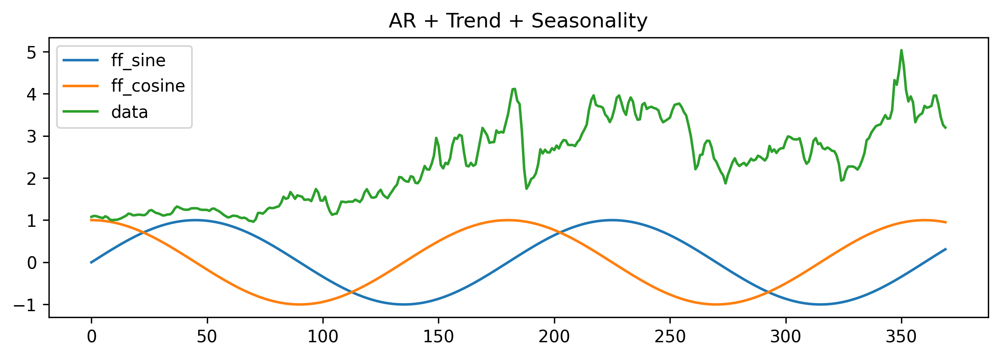

In [22]:
t_data =  list(range(len(df_gas.gas_price)))
n_order = 5
periods = np.array(t_data) / 180

fourier_features = pd.DataFrame(
    {
        f"{func}_order_{order}": getattr(np, func)(2 * np.pi * periods * order)
        for order in range(1, n_order + 1)
        for func in ("sin", "cos")
    }
)

y_t_s = df_gas.gas_price #+ 0.1 * fourier_features["sin_order_1"]

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(fourier_features["sin_order_1"],label='ff_sine')
ax.plot(fourier_features["cos_order_1"],label='ff_cosine')
ax.plot(df_gas.gas_price,label='data')
ax.set_title("AR + Trend + Seasonality")
ax.legend();

In [23]:
# gas
prediction_length_g = len(df_gas) + months_diff(max(df_gas.date).date(), date(2050, 1, 1))
priors_0 = {
    "coefs": {"mu": [0.2, 0.2], "sigma": [0.1, 0.1], "size": 2},
    "sigma": .5,
    "init": {"mu": 2, "sigma": 0.1, "size": 1},
    "alpha": {"mu": 1, "sigma": 0.1},      # trend intercept
    "beta": {"mu": .005, "sigma": .01},    # trend slope
    "beta_fourier": {"mu": 0, "sigma": .5}, # seasonality
}

idata_t_s, preds_t_s, model = make_latent_AR_trend_seasonal_model(y_t_s, fourier_features, priors_0,
                                                                 prediction_steps=prediction_length_g,
                                                                 samples = 100)

Sampling: [alpha, ar, beta, beta_fourier, coefs, likelihood, sigma]
Only 100 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [coefs, sigma, ar, alpha, beta, beta_fourier]


Sampling 2 chains for 1_000 tune and 100 draw iterations (2_000 + 200 draws total) took 220 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Sampling: [likelihood]


Sampling: [ar1_fut, likelihood, yhat_fut]


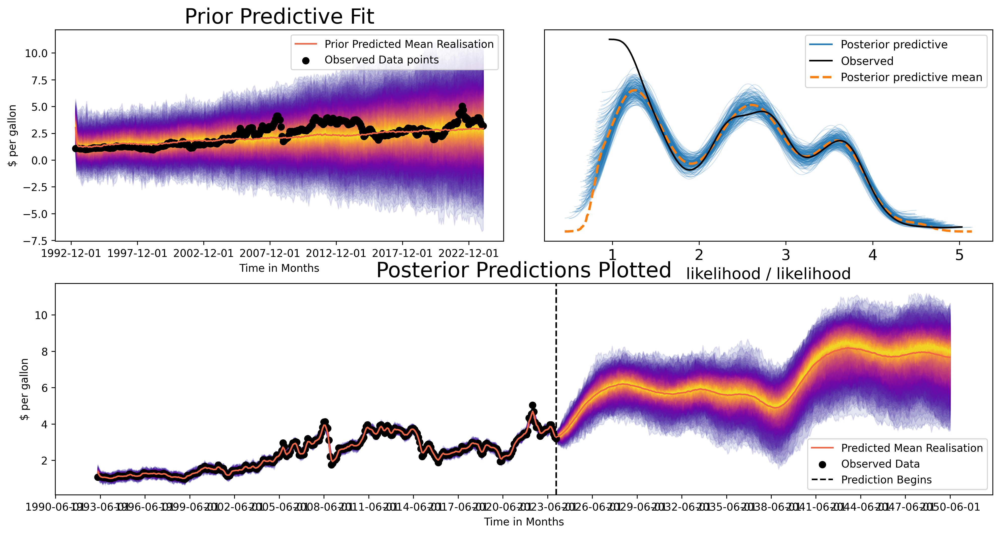

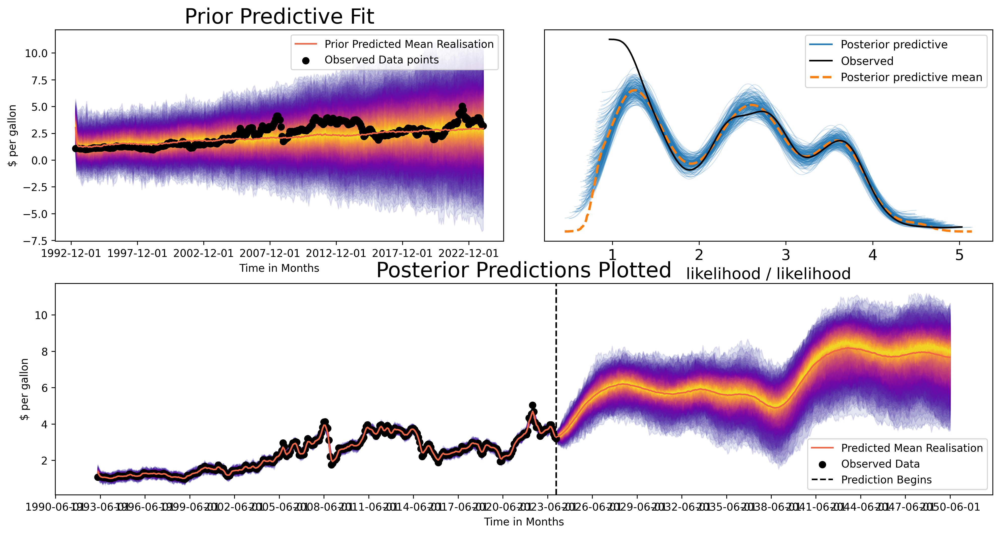

In [24]:
plot_fits(idata_t_s, preds_t_s,'#F06543','gas_bayes')

### ELECTRIC BAYESIAN

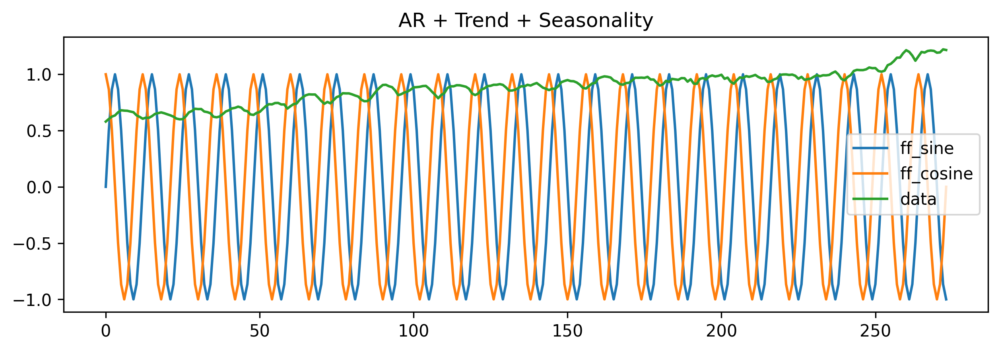

In [25]:
df_kwh = df_kwh.sort_values('date').reset_index(drop=True) # orient correctly
t_data =  list(range(len(df_kwh.gal_price)))
n_order = 5
periods = np.array(t_data) / 12

fourier_features_e = pd.DataFrame(
    {
        f"{func}_order_{order}": getattr(np, func)(2 * np.pi * periods * order)
        for order in range(1, n_order + 1)
        for func in ("sin", "cos")
    }
)

y_t_s_e = df_kwh.gal_price #+ 0.1 * fourier_features["sin_order_1"]

fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(fourier_features_e["sin_order_1"],label='ff_sine')
ax.plot(fourier_features_e["cos_order_1"],label='ff_cosine')
ax.plot(df_kwh.gal_price,label='data')
ax.set_title("AR + Trend + Seasonality")
ax.legend();

In [26]:
# electric
prediction_length = len(df_kwh) + months_diff(max(df_kwh.date).date(), date(2030, 1, 1))

priors_e = {
    "coefs": {"mu": [0.2, 0.2], "sigma": [0.1, 0.1], "size": 2},
    "sigma": .25,
    "init": {"mu": 1, "sigma": 0.1, "size": 1},
    "alpha": {"mu": .5, "sigma": 0.1},      # trend intercept
    "beta": {"mu": .001, "sigma": .01},    # trend slope
    "beta_fourier": {"mu": 0, "sigma": 2}, # seasonality
}

idata_elec, preds_elec, model_elec = make_latent_AR_trend_seasonal_model(y_t_s_e, fourier_features_e, priors_e,
                                                                 prediction_steps=prediction_length,
                                                                 samples = 500)

Sampling: [alpha, ar, beta, beta_fourier, coefs, likelihood, sigma]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [coefs, sigma, ar, alpha, beta, beta_fourier]


Sampling 2 chains for 1_000 tune and 500 draw iterations (2_000 + 1_000 draws total) took 148 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
Sampling: [likelihood]


Sampling: [ar1_fut, likelihood, yhat_fut]


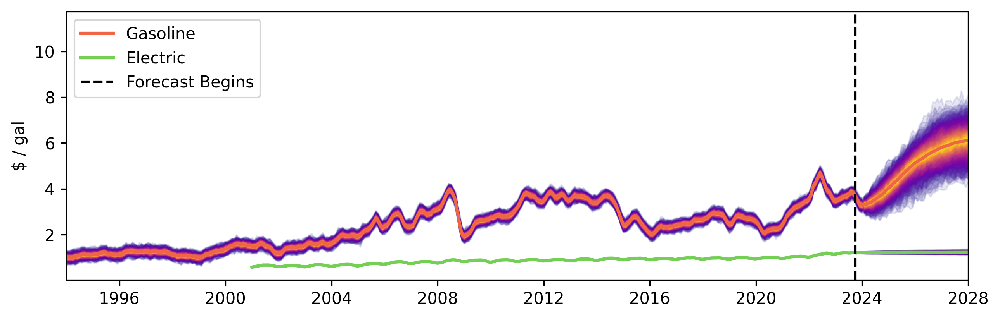

In [27]:
percs = np.linspace(51, 99, 100)
palette = "plasma"
cmap = plt.get_cmap(palette)
percs = np.linspace(51, 99, 100)
colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))
pred_len = len(preds_t_s["predictions"].coords["obs_id_fut"].data)
pred_len_e = len(preds_elec["predictions"].coords["obs_id_fut"].data)

fig = plt.figure(figsize=(10,3))


for i, p in enumerate(percs[::-1]):

        # PREDICTION
        upper = np.percentile(
            az.extract_dataset(preds_t_s, group="predictions", num_samples=1000)["yhat_fut"],
            p,
            axis=1,
        )
        lower = np.percentile(
            az.extract_dataset(preds_t_s, group="predictions", num_samples=1000)["yhat_fut"],
            100 - p,
            axis=1,
        )
        color_val = colors[i]
        plt.fill_between(
            x=pd.date_range(max(df_gas.date), periods=pred_len,freq = 'M'),
            #np.arange(2023, 2023+6.3, 1/12)),#preds_t_s["predictions"].coords["obs_id_fut"].data,
            y1=upper.flatten(),
            y2=lower.flatten(),
            color=cmap(color_val),
            alpha=0.1,
        )
        
        # elec
        # PREDICTION
        upper = np.percentile(
            az.extract_dataset(preds_elec, group="predictions", num_samples=1000)["yhat_fut"],
            p,
            axis=1,
        )
        lower = np.percentile(
            az.extract_dataset(preds_elec, group="predictions", num_samples=1000)["yhat_fut"],
            100 - p,
            axis=1,
        )
        color_val = colors[i]
        plt.fill_between(
            x=pd.date_range(max(df_kwh.date), periods=pred_len_e,freq = 'M'),
            #np.arange(2023, 2023+6.3, 1/12)),#preds_t_s["predictions"].coords["obs_id_fut"].data,
            y1=upper.flatten(),
            y2=lower.flatten(),
            color=cmap(color_val),
            alpha=0.1,
        )
        
        
        # LIKELIHOOD GAS
        upper = np.percentile(
            az.extract_dataset(preds_t_s, group="predictions", num_samples=1000)["likelihood"],
            p,
            axis=1,
        )
        lower = np.percentile(
            az.extract_dataset(preds_t_s, group="predictions", num_samples=1000)["likelihood"],
            100 - p,
            axis=1,
        )
        color_val = colors[i]
        plt.fill_between(
            x=df_gas.date, #np.arange(min(df_gas.year), max(df_gas.year), (max(df_gas.year)-min(df_gas.year))/365),#preds_t_s["predictions_constant_data"]["t"],
            y1=upper.flatten(),
            y2=lower.flatten(),
            color=cmap(color_val),
            alpha=0.1
        )
        
        # LIKELIHOOD ELECTRIC
        upper = np.percentile(
            az.extract_dataset(preds_elec, group="predictions", num_samples=1000)["likelihood"],
            p,
            axis=1,
        )
        lower = np.percentile(
            az.extract_dataset(preds_elec, group="predictions", num_samples=1000)["likelihood"],
            100 - p,
            axis=1,
        )
        color_val = colors[i]
        plt.fill_between(
            x=df_kwh.date, #np.arange(min(df_gas.year), max(df_gas.year), (max(df_gas.year)-min(df_gas.year))/365),#preds_t_s["predictions_constant_data"]["t"],
            y1=upper.flatten(),
            y2=lower.flatten(),
            color=cmap(color_val),
            alpha=0.1
        )
        
g_color = '#F06543'
e_color = '#73D055FF'

# GAS LINES
plt.plot(df_gas.date,
         az.extract_dataset(preds_t_s, group="predictions", num_samples=1000)["likelihood"].mean(axis=1),
         color=g_color, #"cyan"
         linewidth=2
        )

plt.plot(pd.date_range(max(df_gas.date), periods=pred_len,freq = 'M'),
         preds_t_s.predictions.yhat_fut.mean(["chain", "draw"]),
         color=g_color, #"cyan",
         linewidth=2,
         label="Gasoline")
        
# ELECTRIC LINES
plt.plot(df_kwh.date,
         az.extract_dataset(preds_elec, group="predictions", num_samples=1000)["likelihood"].mean(axis=1),
         color=e_color,
         linewidth=2 #"green"
        )

plt.plot(pd.date_range(max(df_kwh.date), periods=pred_len_e,freq = 'M'),
         preds_elec.predictions.yhat_fut.mean(["chain", "draw"]),
         color=e_color, #"green",
         label="Electric",
         linewidth=2
        )
        
# plt.scatter(df_gas.date,df_gas.gas_price,label='gasoline price',c='#313330',alpha=.85,s=10)
# plt.scatter(df_kwh.date,df_kwh.gal_price,label='electric equivalent',c='green',alpha=.85,s=10)
plt.axvline(np.max(df_kwh.date), color="black",label='Forecast Begins',linestyle ="--")
plt.legend(loc='upper left')
plt.xlim(
    xmin=datetime(1994, 1, 1, hour=1), # the one that doesn't change
    xmax=datetime(2028, 1, 1, hour=1))
plt.ylabel('$ / gal')
fig.savefig('plots/model_comparison.png', transparent=True);

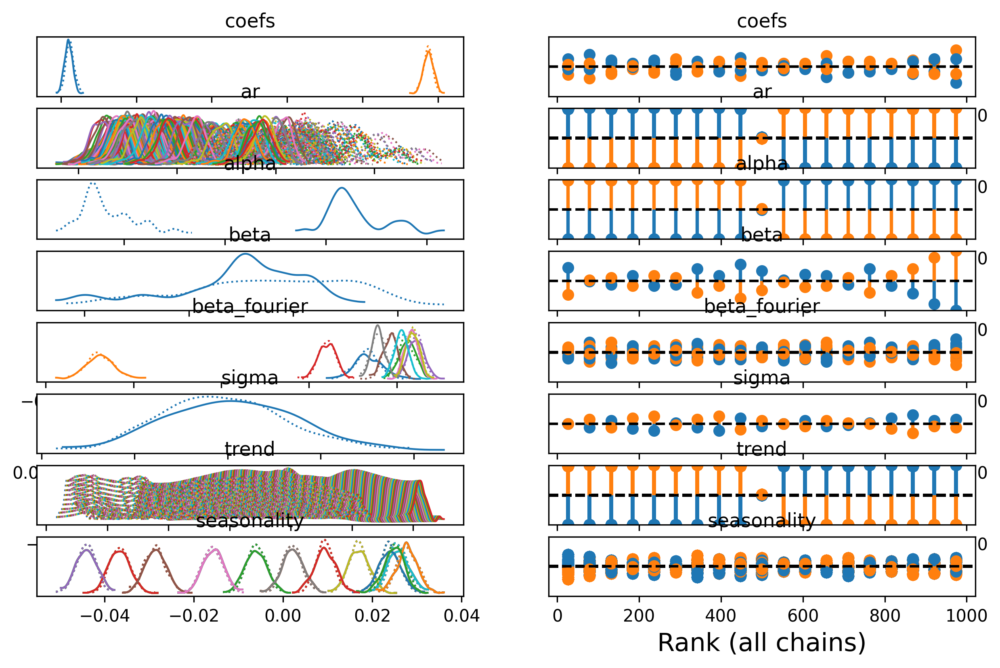

In [28]:
az.plot_trace(idata_elec, figsize=(10, 6), kind="rank_vlines");

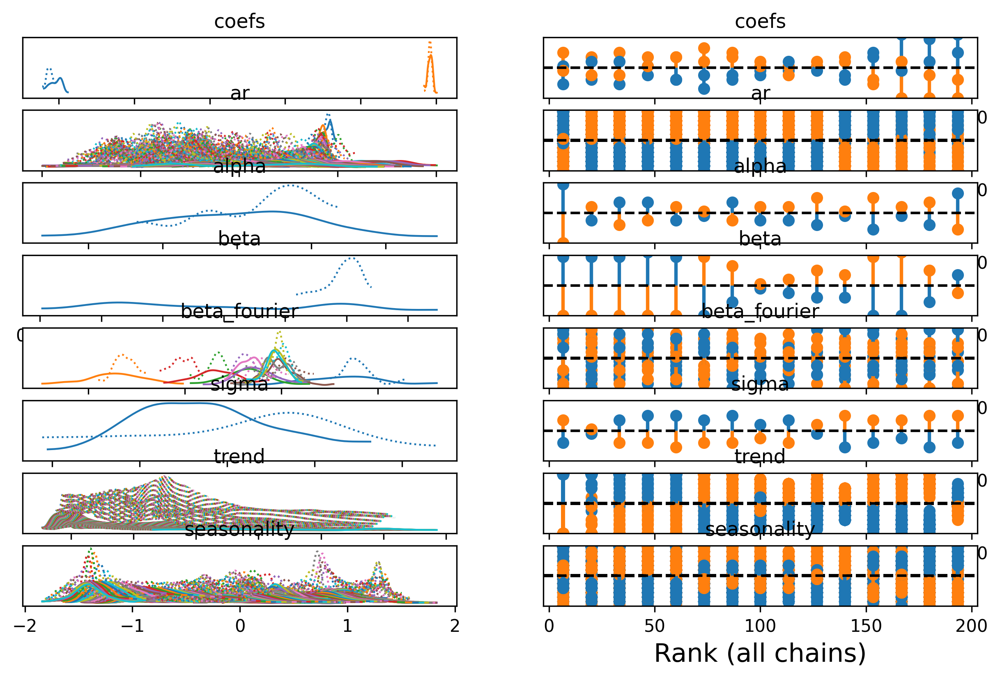

In [29]:
az.plot_trace(idata_t_s, figsize=(10, 6), kind="rank_vlines");

In [30]:
# pm.model_to_graphviz(model)